<a href="https://colab.research.google.com/github/Marcelooyola/Modulo7/blob/main/copia_de_rg_01_mapa_plotly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![logo](https://github.com/cristiandarioortegayubro/BA/blob/main/dba.png?raw=true)

![](https://scikit-learn.org/stable/_static/scikit-learn-logo-small.png)

# **Regresión**


# ***Arbol de Regresión***

## **Bibliotecas**

### **Instalando bibliotecas**

In [1]:
!pip install plotly --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 80.8 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.15.0
    Uninstalling plotly-5.15.0:
      Successfully uninstalled plotly-5.15.0


### **Análisis de datos**

In [2]:
import numpy as np
import pandas as pd

### **Gráficos**

In [3]:
import plotly.express as px
import matplotlib.pyplot as plt

### **Preprocesado y modelado**

#### **Con Scikit-learn**

In [4]:
import sklearn
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
#from sklearn.tree import export_graphviz
#from sklearn.tree import export_text
#from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

## **Conjunto de Datos**

Dataset completo:
https://www.kaggle.com/code/msorondo/a-housing-price-predictor-for-buenos-aires-c/data

In [5]:
#url = "https://raw.githubusercontent.com/cristiandarioortegayubro/BA/main/Datasets/propiedades.csv"

In [6]:
url = "https://raw.githubusercontent.com/gustavomachin/PublicDataSets/master/DataSets/propiedadesCABA.csv"

## ***Dataframe***

In [7]:
datos = pd.read_csv(url, index_col = 0)

In [8]:
datos.head(10)

,lat,lon,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,-34.567000,-58.470011,Belgrano,5.0,3.0,2.0,116.0,88.0,310000.0,PH
1,-34.636405,-58.475218,Floresta,3.0,2.0,1.0,188.0,88.0,169000.0,PH
2,-34.545527,-58.480007,Saavedra,4.0,2.0,1.0,96.0,96.0,229000.0,PH
3,-34.574876,-58.442355,Colegiales,6.0,4.0,3.0,125.0,168.0,295000.0,PH
4,-34.623167,-58.517425,Villa Real,3.0,2.0,2.0,60.0,50.0,149900.0,PH
5,-34.599578,-58.445120,Villa Crespo,3.0,2.0,1.0,89.0,82.0,169000.0,PH
6,-34.598244,-58.448507,Villa Crespo,3.0,2.0,1.0,70.0,52.0,137000.0,PH
7,-34.591859,-58.517869,Villa Devoto,4.0,3.0,2.0,212.0,148.0,285000.0,PH
8,-34.611639,-58.476158,Villa del Parque,3.0,2.0,1.0,52.0,46.0,68000.0,PH
9,-34.576751,-58.507143,Villa Pueyrredón,3.0,2.0,2.0,85.0,75.0,174900.0,PH


In [9]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 182702 entries, 0 to 182701
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   lat              157868 non-null  float64
 1   lon              157746 non-null  float64
 2   l3               162334 non-null  object 
 3   rooms            123506 non-null  float64
 4   bedrooms         87309 non-null   float64
 5   bathrooms        154269 non-null  float64
 6   surface_total    118091 non-null  float64
 7   surface_covered  114078 non-null  float64
 8   price            182702 non-null  float64
 9   property_type    182702 non-null  object 
dtypes: float64(8), object(2)
memory usage: 15.3+ MB


**Diccionario de variables:**

* lat - latitud
* lon - longitud
* l3 - barrio
* rooms - cantidad de habitaciones
* bedrooms - cantidad de dormitorios
* bathrooms - cantidad de baños
* surface_total - superficie total
* surface_covered - superficie cubierta
* price - precio
* property_type - tipo de propiedad

In [10]:
lista = ["Latitud", "Longitud", "Barrio", "Ambientes", "Habitaciones", "Baños", "Sup_Total", "Sup_Cubierta", "Precio", "Tipo_Propiedad"]
datos.columns = lista
datos.head()

,Latitud,Longitud,Barrio,Ambientes,Habitaciones,Baños,Sup_Total,Sup_Cubierta,Precio,Tipo_Propiedad
0,-34.567000,-58.470011,Belgrano,5.0,3.0,2.0,116.0,88.0,310000.0,PH
1,-34.636405,-58.475218,Floresta,3.0,2.0,1.0,188.0,88.0,169000.0,PH
2,-34.545527,-58.480007,Saavedra,4.0,2.0,1.0,96.0,96.0,229000.0,PH
3,-34.574876,-58.442355,Colegiales,6.0,4.0,3.0,125.0,168.0,295000.0,PH
4,-34.623167,-58.517425,Villa Real,3.0,2.0,2.0,60.0,50.0,149900.0,PH


## ***Análisis exploratorio de datos***

In [11]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 182702 entries, 0 to 182701
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Latitud         157868 non-null  float64
 1   Longitud        157746 non-null  float64
 2   Barrio          162334 non-null  object 
 3   Ambientes       123506 non-null  float64
 4   Habitaciones    87309 non-null   float64
 5   Baños           154269 non-null  float64
 6   Sup_Total       118091 non-null  float64
 7   Sup_Cubierta    114078 non-null  float64
 8   Precio          182702 non-null  float64
 9   Tipo_Propiedad  182702 non-null  object 
dtypes: float64(8), object(2)
memory usage: 15.3+ MB


In [12]:
datos.groupby(by=datos.Barrio).Precio.median().sort_values(ascending=False).head(10)

Barrio
Puerto Madero           690000.0
Catalinas               290000.0
Las Cañitas             287000.0
Recoleta                240000.0
Belgrano                235000.0
Distrito Audiovisual    225000.0
Palermo                 210000.0
Nuñez                   210000.0
Villa Devoto            208000.0
Agronomía               202500.0
Name: Precio, dtype: float64

In [13]:
datos.describe().T

,count,mean,std,min,25%,50%,75%,max
Latitud,157868.0,-34.580561,0.360652,-48.920000,-34.616014,-34.60076,-34.584055,1.000000e+00
Longitud,157746.0,-58.488759,0.599586,-71.658058,-58.462315,-58.43555,-58.408813,-5.382858e+01
Ambientes,123506.0,2.714556,1.533125,1.000000,2.000000,3.00000,3.000000,4.000000e+01
Habitaciones,87309.0,1.987206,2.213955,0.000000,1.000000,2.00000,3.000000,3.030000e+02
Baños,154269.0,1.539013,0.924807,1.000000,1.000000,1.00000,2.000000,2.000000e+01
Sup_Total,118091.0,150.372120,1120.385477,0.000000,45.000000,70.00000,129.000000,1.291890e+05
Sup_Cubierta,114078.0,144.625826,1684.709492,1.000000,40.000000,60.00000,100.000000,1.260620e+05
Precio,182702.0,278640.763407,503564.401587,5000.000000,100000.000000,160000.00000,279000.000000,4.553535e+07


In [14]:
datos.describe(include="object").T

,count,unique,top,freq
Barrio,162334,58,Palermo,21656
Tipo_Propiedad,182702,10,Departamento,110718


In [15]:
datos.isnull().sum()

Latitud           24834
Longitud          24956
Barrio            20368
Ambientes         59196
Habitaciones      95393
Baños             28433
Sup_Total         64611
Sup_Cubierta      68624
Precio                0
Tipo_Propiedad        0
dtype: int64

In [16]:
datos.isnull().mean()

Latitud           0.135926
Longitud          0.136594
Barrio            0.111482
Ambientes         0.324003
Habitaciones      0.522123
Baños             0.155625
Sup_Total         0.353641
Sup_Cubierta      0.375606
Precio            0.000000
Tipo_Propiedad    0.000000
dtype: float64

In [17]:
px.histogram(datos,
             x = datos.Precio,
             marginal="box",
             template = "gridon")

In [18]:
px.box(datos,
       x = datos.Precio,
       template = "gridon")

In [19]:
datos.drop(datos[datos.Precio > 547000].index, axis=0, inplace = True)

In [20]:
datos.head()

,Latitud,Longitud,Barrio,Ambientes,Habitaciones,Baños,Sup_Total,Sup_Cubierta,Precio,Tipo_Propiedad
0,-34.567000,-58.470011,Belgrano,5.0,3.0,2.0,116.0,88.0,310000.0,PH
1,-34.636405,-58.475218,Floresta,3.0,2.0,1.0,188.0,88.0,169000.0,PH
2,-34.545527,-58.480007,Saavedra,4.0,2.0,1.0,96.0,96.0,229000.0,PH
3,-34.574876,-58.442355,Colegiales,6.0,4.0,3.0,125.0,168.0,295000.0,PH
4,-34.623167,-58.517425,Villa Real,3.0,2.0,2.0,60.0,50.0,149900.0,PH


In [21]:
datos.isnull().mean()

Latitud           0.141352
Longitud          0.141990
Barrio            0.119882
Ambientes         0.303159
Habitaciones      0.509520
Baños             0.129436
Sup_Total         0.366632
Sup_Cubierta      0.370859
Precio            0.000000
Tipo_Propiedad    0.000000
dtype: float64

## ***Relación entre variables***

In [22]:
corr_matrix = round(datos.corr(),3)

<ipython-input-22-95485efea91c>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



### **Matriz de correlaciones**

In [23]:
px.imshow(corr_matrix,
          title = "Matriz de correlacion",
          text_auto = True,
          template = "gridon",
          labels={"color":"Coeficiente"})

Ambientes, habitaciones y baños son variables explicativas que están correlacionadas entre si. Particularmente, ambientes y habitaciones tiene un coeficiente de correlación muy alto (0.908). Dado que Habitaciones tiene un 50.95% de datos faltantes, es recomendable eliminar esa columna. Además, la cantidad de ambientes tiene mayor correlación con el precio que la cantidad de habitaciones.

In [24]:
datos.drop(columns=["Habitaciones"], inplace=True)

In [25]:
datos

,Latitud,Longitud,Barrio,Ambientes,Baños,Sup_Total,Sup_Cubierta,Precio,Tipo_Propiedad
0,-34.567000,-58.470011,Belgrano,5.0,2.0,116.0,88.0,310000.0,PH
1,-34.636405,-58.475218,Floresta,3.0,1.0,188.0,88.0,169000.0,PH
2,-34.545527,-58.480007,Saavedra,4.0,1.0,96.0,96.0,229000.0,PH
3,-34.574876,-58.442355,Colegiales,6.0,3.0,125.0,168.0,295000.0,PH
4,-34.623167,-58.517425,Villa Real,3.0,2.0,60.0,50.0,149900.0,PH
...,...,...,...,...,...,...,...,...,...
182689,-34.662399,-58.513406,Mataderos,NaN,4.0,NaN,NaN,420000.0,Otro
182690,-34.657242,-58.502971,Mataderos,NaN,4.0,NaN,NaN,250000.0,Otro
182692,-34.601508,-58.442835,Villa Crespo,NaN,4.0,NaN,NaN,390000.0,Otro
182695,-34.602435,-58.493517,Villa del Parque,NaN,4.0,NaN,NaN,480000.0,Otro


In [26]:
datos.isnull().mean()

Latitud           0.141352
Longitud          0.141990
Barrio            0.119882
Ambientes         0.303159
Baños             0.129436
Sup_Total         0.366632
Sup_Cubierta      0.370859
Precio            0.000000
Tipo_Propiedad    0.000000
dtype: float64

Se procede a eliminar las filas con valores faltantes. Otra alternativa a probar es la imputación de valores faltantes.

In [27]:
datos.dropna(axis=0, inplace = True)

In [28]:
datos

,Latitud,Longitud,Barrio,Ambientes,Baños,Sup_Total,Sup_Cubierta,Precio,Tipo_Propiedad
0,-34.567000,-58.470011,Belgrano,5.0,2.0,116.0,88.0,310000.0,PH
1,-34.636405,-58.475218,Floresta,3.0,1.0,188.0,88.0,169000.0,PH
2,-34.545527,-58.480007,Saavedra,4.0,1.0,96.0,96.0,229000.0,PH
3,-34.574876,-58.442355,Colegiales,6.0,3.0,125.0,168.0,295000.0,PH
4,-34.623167,-58.517425,Villa Real,3.0,2.0,60.0,50.0,149900.0,PH
...,...,...,...,...,...,...,...,...,...
182615,-34.562981,-58.448681,Belgrano,3.0,3.0,346.0,185.0,510000.0,Departamento
182627,-34.601799,-58.430832,Almagro,4.0,3.0,144.0,118.0,335000.0,Departamento
182628,-34.583792,-58.400951,Palermo,4.0,3.0,135.0,131.0,380000.0,Departamento
182629,-34.589228,-58.424017,Palermo,4.0,3.0,168.0,142.0,347000.0,Departamento


In [29]:
datos.isnull().mean()

Latitud           0.0
Longitud          0.0
Barrio            0.0
Ambientes         0.0
Baños             0.0
Sup_Total         0.0
Sup_Cubierta      0.0
Precio            0.0
Tipo_Propiedad    0.0
dtype: float64

In [30]:
px.scatter(datos,
           x = datos.Sup_Cubierta,
           y = datos.Precio,
           template = "gridon")

In [31]:
px.box(datos,
       x = datos.Sup_Cubierta)

In [32]:
datos = datos.drop(datos[datos.Sup_Cubierta > 140].index)

In [33]:
px.scatter(datos,
           x = datos.Sup_Cubierta,
           y = datos.Precio,
           trendline = 'ols',
           trendline_color_override = 'red',
           template = "gridon")

In [34]:
px.scatter(datos,
           x = datos.Sup_Cubierta,
           y = datos.Precio,
           template = "gridon",
           color = datos.Barrio)

## ***Mapa***

In [35]:
datos.describe().T

,count,mean,std,min,25%,50%,75%,max
Latitud,75786.0,-34.597966,0.023021,-34.695465,-34.611649,-34.598362,-34.583380,-34.528633
Longitud,75786.0,-58.436769,0.034122,-58.530467,-58.457437,-58.434432,-58.414167,-58.353508
Ambientes,75786.0,2.474652,1.092561,1.000000,2.000000,2.000000,3.000000,30.000000
Baños,75786.0,1.287969,0.545645,1.000000,1.000000,1.000000,1.000000,11.000000
Sup_Total,75786.0,73.459016,428.369633,10.000000,42.000000,60.000000,85.000000,108960.000000
Sup_Cubierta,75786.0,59.652904,26.556266,1.000000,39.000000,53.000000,75.000000,140.000000
Precio,75786.0,174212.900800,89919.773177,5000.000000,108500.000000,150000.000000,220000.000000,547000.000000


In [45]:
def precios_cat(precio):
    if precio < 100000:
        return "bajo"
    elif precio < 150000:
        return "medio_bajo"
    elif precio < 200000:
        return "medio_alto"
    elif precio < 400000:
        return "alto"
    else:
      return "muy_alto"

In [46]:
datos["Precio_2"] = datos.Precio.apply(precios_cat)

In [47]:
datos.head()

,Latitud,Longitud,Barrio,Ambientes,Baños,Sup_Total,Sup_Cubierta,Precio,Tipo_Propiedad,Precio_2
0,-34.567000,-58.470011,Belgrano,5.0,2.0,116.0,88.0,310000.0,PH,alto
1,-34.636405,-58.475218,Floresta,3.0,1.0,188.0,88.0,169000.0,PH,medio_alto
2,-34.545527,-58.480007,Saavedra,4.0,1.0,96.0,96.0,229000.0,PH,alto
4,-34.623167,-58.517425,Villa Real,3.0,2.0,60.0,50.0,149900.0,PH,medio_bajo
5,-34.599578,-58.445120,Villa Crespo,3.0,1.0,89.0,82.0,169000.0,PH,medio_alto


In [48]:
datos.Precio_2.describe()

count          75786
unique             5
top       medio_bajo
freq           22070
Name: Precio_2, dtype: object

In [49]:
fig = px.scatter_mapbox(datos,
                        lat="Latitud",
                        lon="Longitud",
                        hover_data=["Barrio", "Precio"],
                        color = "Precio_2",
                        color_discrete_sequence=px.colors.qualitative.G10,
                        center={"lat":-34.60652, "lon":-58.43557},
                        zoom=10
                        )
fig.update_layout(mapbox_style="open-street-map")
fig.show()

## ***Codificación de variables categóricas***

In [ ]:
datos = pd.get_dummies(datos, columns=["Barrio","Tipo_Propiedad"])

In [ ]:
datos.head()

,Latitud,Longitud,Ambientes,Baños,Sup_Total,Sup_Cubierta,Precio,Precio_2,Barrio_Abasto,Barrio_Agronomía,...,Tipo_Propiedad_Casa,Tipo_Propiedad_Casa de campo,Tipo_Propiedad_Cochera,Tipo_Propiedad_Departamento,Tipo_Propiedad_Depósito,Tipo_Propiedad_Local comercial,Tipo_Propiedad_Lote,Tipo_Propiedad_Oficina,Tipo_Propiedad_Otro,Tipo_Propiedad_PH
0,-34.567000,-58.470011,5.0,2.0,116.0,88.0,310000.0,alto,0,0,...,0,0,0,0,0,0,0,0,0,1
1,-34.636405,-58.475218,3.0,1.0,188.0,88.0,169000.0,medio_alto,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-34.545527,-58.480007,4.0,1.0,96.0,96.0,229000.0,alto,0,0,...,0,0,0,0,0,0,0,0,0,1
4,-34.623167,-58.517425,3.0,2.0,60.0,50.0,149900.0,medio_bajo,0,0,...,0,0,0,0,0,0,0,0,0,1
5,-34.599578,-58.445120,3.0,1.0,89.0,82.0,169000.0,medio_alto,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
datos.shape

(75786, 75)

## ***División de los datos en train y test***

In [ ]:
X = datos.drop(columns=['Precio','Precio_2','Latitud','Longitud'])
y = datos['Precio']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    train_size = 0.80,
                                                    random_state = 1)

## ***Arbol de regresión***

[Árbol de regresión](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html)

### **Creación del modelo**

In [ ]:
modelo = DecisionTreeRegressor(random_state=1)
modelo.fit(X_train, y_train)

DecisionTreeRegressor(random_state=1)

In [ ]:
#Hiperparámetros del algoritmo
modelo.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 1,
 'splitter': 'best'}

In [ ]:
print(f"Profundidad del árbol: {modelo.get_depth()}")
print(f"Número de nodos terminales: {modelo.get_n_leaves()}")

Profundidad del árbol: 66
Número de nodos terminales: 25480


### **Predicción**

In [ ]:
predicciones = modelo.predict(X_test)
print(predicciones[0:3,])

[190000.          83583.33333333 106200.        ]


In [ ]:
tabla = pd.DataFrame({"Real": y_test,
                      "Predicción": predicciones,
                      "Diferencia":(predicciones-y_test)/y_test})
tabla

,Real,Predicción,Diferencia
14052,210000.0,190000.000000,-0.095238
122626,70000.0,83583.333333,0.194048
44491,105000.0,106200.000000,0.011429
77369,112000.0,119295.491803,0.065138
79400,260000.0,235000.000000,-0.096154
...,...,...,...
156244,190000.0,159000.000000,-0.163158
87244,135000.0,142083.333333,0.052469
2410,134500.0,145595.111111,0.082492
126001,275000.0,284064.571429,0.032962


In [ ]:
tabla.mean()

Real          173720.240401
Predicción    173881.006912
Diferencia         0.029356
dtype: float64

### **Evaluacion del modelo**

#### **Error de la media de los cuadrados - MSE**

In [ ]:
round(mean_squared_error(y_test, predicciones,squared=False),3)

40295.107

#### **Error de la media absoluta - MAE**


In [ ]:
round(metrics.median_absolute_error(y_test, predicciones),3)

9072.182

#### **Coeficiente de determinación ($R^2$)**


In [ ]:
round(metrics.r2_score(y_test, predicciones),3)

0.793

## **Graficando el modelo**

In [ ]:
modelo2 = DecisionTreeRegressor(max_depth=3, random_state=1)
modelo2.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3, random_state=1)

In [ ]:
print(f"Profundidad del árbol: {modelo2.get_depth()}")
print(f"Número de nodos terminales: {modelo2.get_n_leaves()}")
print(f"El R2 es de: {metrics.r2_score(y_test,modelo2.predict(X_test))}")

Profundidad del árbol: 3
Número de nodos terminales: 8
El R2 es de: 0.5923050875741825


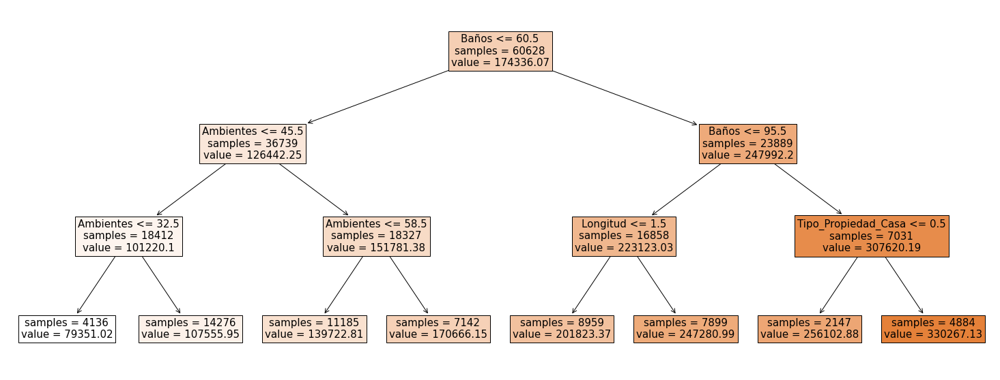

In [ ]:
fig, ax = plt.subplots(figsize=(26, 10))
plot = plot_tree(
            decision_tree = modelo2,
            feature_names = datos.drop(columns = "Precio").columns,
            class_names   = 'Precio',
            filled        = True,
            impurity      = False,
            fontsize      = 15,
            precision     = 2,
            ax            = ax)

## **Importancia de predictores**

La importancia de cada predictor en modelo se calcula como la reducción total (normalizada) en el criterio de división, en este caso el MSE, que consigue el predictor en las divisiones en las que participa. Si un predictor no ha sido seleccionado en ninguna divisón, no se ha incluido en el modelo y por lo tanto su importancia es 0.

In [ ]:
importancia_predictores = pd.DataFrame(
                            {'Predictor': X.columns,
                             'Importancia': modelo.feature_importances_*100})
print(" ")
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('Importancia', ascending=False)


 
Importancia de los predictores en el modelo
-------------------------------------------


,Predictor,Importancia
3,Sup_Cubierta,58.602708
2,Sup_Total,16.213894
1,Baños,3.602886
30,Barrio_Palermo,3.199034
64,Tipo_Propiedad_Departamento,2.432814
...,...,...
65,Tipo_Propiedad_Depósito,0.002786
67,Tipo_Propiedad_Lote,0.001959
14,Barrio_Catalinas,0.000318
63,Tipo_Propiedad_Cochera,0.000105
